Dataset

In [3]:
#!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="TfoM6rINkHilrNXWVZxW")
project = rf.workspace("safety-measure").project("sh17-dataset")
version = project.version(1)
dataset = version.download("coco")

loading Roboflow workspace...
loading Roboflow project...


Loading model

In [4]:
from rfdetr import RFDETRBase
import torch.nn as nn
import torch

model = RFDETRBase()
history = []

# if torch.cuda.device_count() > 1:
#     model = nn.DataParallel(model)

def callback2(data):
    history.append(data)

# model.callbacks["on_fit_epoch_end"].append(callback2)

Loading pretrain weights


In [5]:
model.train(
    dataset_dir=dataset.location,
    epochs=100,
    batch_size=4,
    img_size=480,
    lr=0.001,
    save_dir="checkpoints",
    save_interval=10,
    val_interval=1,
    output_dir="output3-finetune2",
    device="cuda"
)

num_classes mismatch: model has 90 classes, but your dataset has 18 classes
reinitializing your detection head with 18 classes.
fatal: not a git repository (or any of the parent directories): .git


Unable to initialize TensorBoard. Logging is turned off for this session.  Run 'pip install tensorboard' to enable logging.
Not using distributed mode
git:
  sha: N/A, status: clean, branch: N/A

Namespace(num_classes=18, grad_accum_steps=4, amp=True, lr=0.001, lr_encoder=0.00015, batch_size=4, weight_decay=0.0001, epochs=100, lr_drop=100, clip_max_norm=0.1, lr_vit_layer_decay=0.8, lr_component_decay=0.7, do_benchmark=False, dropout=0, drop_path=0.0, drop_mode='standard', drop_schedule='constant', cutoff_epoch=0, pretrained_encoder=None, pretrain_weights='rf-detr-base.pth', pretrain_exclude_keys=None, pretrain_keys_modify_to_load=None, pretrained_distiller=None, encoder='dinov2_windowed_small', vit_encoder_num_layers=12, window_block_indexes=None, position_embedding='sine', out_feature_indexes=[2, 5, 8, 11], freeze_encoder=False, layer_norm=True, rms_norm=False, backbone_lora=False, force_no_pretrain=False, dec_layers=3, dim_feedforward=2048, hidden_dim=256, sa_nheads=8, ca_nheads=16, 

torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /pytorch/aten/src/ATen/native/TensorShape.cpp:4314.)


Epoch: [0]  [  0/354]  eta: 0:10:01  lr: 0.001000  class_error: 94.32  loss: 18.0580 (18.0580)  loss_ce: 0.5419 (0.5419)  loss_bbox: 1.8947 (1.8947)  loss_giou: 1.9172 (1.9172)  loss_ce_0: 0.4902 (0.4902)  loss_bbox_0: 2.1144 (2.1144)  loss_giou_0: 2.0028 (2.0028)  loss_ce_1: 0.5231 (0.5231)  loss_bbox_1: 1.9535 (1.9535)  loss_giou_1: 1.9404 (1.9404)  loss_ce_enc: 0.4710 (0.4710)  loss_bbox_enc: 2.1402 (2.1402)  loss_giou_enc: 2.0685 (2.0685)  loss_ce_unscaled: 0.5419 (0.5419)  class_error_unscaled: 94.3223 (94.3223)  loss_bbox_unscaled: 0.3789 (0.3789)  loss_giou_unscaled: 0.9586 (0.9586)  cardinality_error_unscaled: 3732.2500 (3732.2500)  loss_ce_0_unscaled: 0.4902 (0.4902)  loss_bbox_0_unscaled: 0.4229 (0.4229)  loss_giou_0_unscaled: 1.0014 (1.0014)  cardinality_error_0_unscaled: 3652.2500 (3652.2500)  loss_ce_1_unscaled: 0.5231 (0.5231)  loss_bbox_1_unscaled: 0.3907 (0.3907)  loss_giou_1_unscaled: 0.9702 (0.9702)  cardinality_error_1_unscaled: 3797.5000 (3797.5000)  loss_ce_enc_uns

In [41]:
model = RFDETRBase(pretrained_weights='/home/ai-laboratory/Documents/Gojii/output3-finetune2/checkpoint_best_total.pth')

Loading pretrain weights


In [44]:
import supervision as sv

ds = sv.DetectionDataset.from_coco(
    images_directory_path=f"{dataset.location}/test",
    annotations_path=f"{dataset.location}/test/_annotations.coco.json",
)

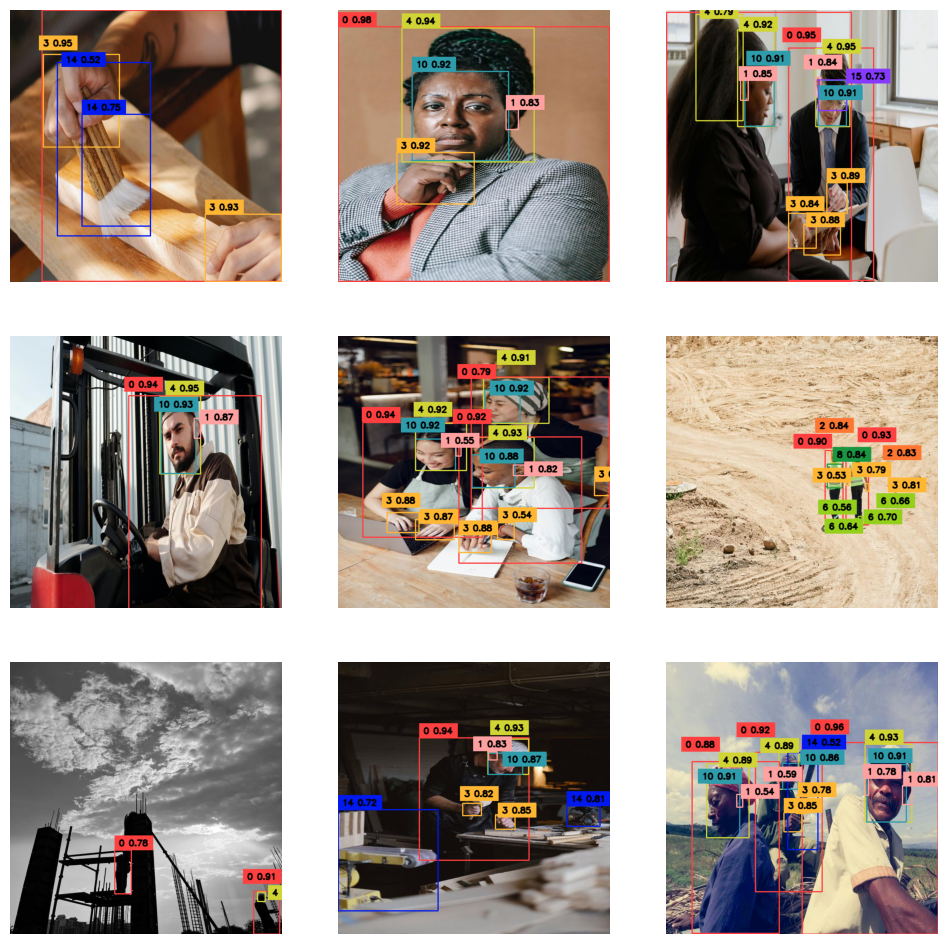

In [45]:
import supervision as sv
from rfdetr import RFDETRBase
from PIL import Image

detections_images = []

for i in range(9):
    path, image, annotations = ds[i]
    image = Image.open(path)

    detections = model.predict(image, threshold=0.5)

    text_scale = sv.calculate_optimal_text_scale(resolution_wh=image.size)
    thickness = sv.calculate_optimal_line_thickness(resolution_wh=image.size)

    bbox_annotator = sv.BoxAnnotator(thickness=thickness)
    label_annotator = sv.LabelAnnotator(
        text_color=sv.Color.BLACK,
        text_scale=text_scale,
        text_thickness=thickness,
        smart_position=True)

    detections_labels = [
        f"{ds.classes[class_id]} {confidence:.2f}"
        for class_id, confidence
        in zip(detections.class_id, detections.confidence)
    ]

    detections_image = image.copy()
    detections_image = bbox_annotator.annotate(detections_image, detections)
    detections_image = label_annotator.annotate(detections_image, detections, detections_labels)

    detections_images.append(detections_image)

sv.plot_images_grid(images=detections_images, grid_size=(3, 3), size=(12, 12))

In [46]:
import supervision as sv
from tqdm import tqdm
from supervision.metrics import MeanAveragePrecision

targets = []
predictions = []

for path, image, annotations in tqdm(ds):
    image = Image.open(path)
    detections = model.predict(image, threshold=0.5)

    targets.append(annotations)
    predictions.append(detections)

100%|██████████| 810/810 [00:20<00:00, 40.35it/s]


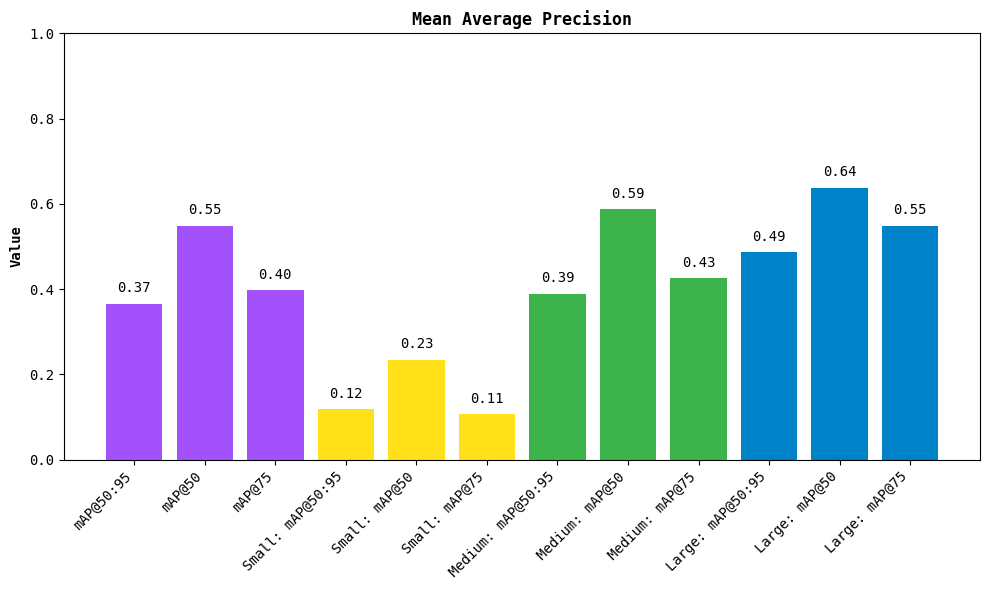

In [47]:
map_metric = MeanAveragePrecision()
map_result = map_metric.update(predictions, targets).compute()

map_result.plot()

In [48]:
print(map_result)

MeanAveragePrecisionResult:
Metric target: MetricTarget.BOXES
Class agnostic: False
mAP @ 50:95: 0.3659
mAP @ 50:    0.5489
mAP @ 75:    0.3972
mAP scores: [0.54894626 0.53811458 0.51949241 0.49857278 0.46002151 0.39722921
 0.3222179  0.22576604 0.12073472 0.02797016]
IoU thresh: [0.5  0.55 0.6  0.65 0.7  0.75 0.8  0.85 0.9  0.95]
AP per class:
  1: [0.78502302 0.77109828 0.75952438 0.74580829 0.72274867 0.6800992
 0.64266112 0.57204115 0.46643494 0.23500276]
  2: [7.19683293e-01 6.99434500e-01 6.75284853e-01 6.41101404e-01
 5.82912603e-01 5.00442773e-01 3.36852597e-01 2.00519838e-01
 3.56178138e-02 1.85498644e-04]
  3: [0.63464517 0.62294421 0.6125903  0.55067647 0.49273448 0.41501907
 0.329444   0.19798509 0.17193565 0.02166214]
  4: [0.79920898 0.78818329 0.77468842 0.73776556 0.68831277 0.61446951
 0.50434884 0.32801224 0.14254358 0.01720201]
  5: [0.77645304 0.77602505 0.76248882 0.75200888 0.72937965 0.68332321
 0.60777572 0.49047915 0.29641946 0.07434224]
  6: [0.4480198  0.4480

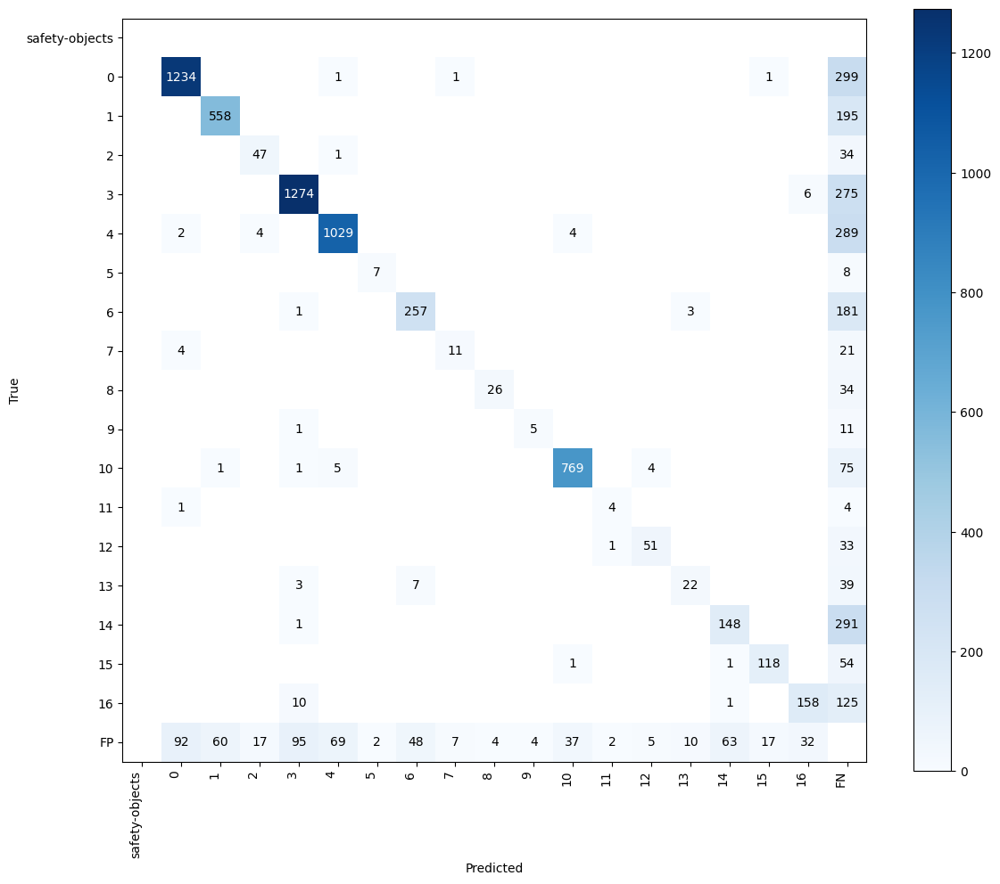

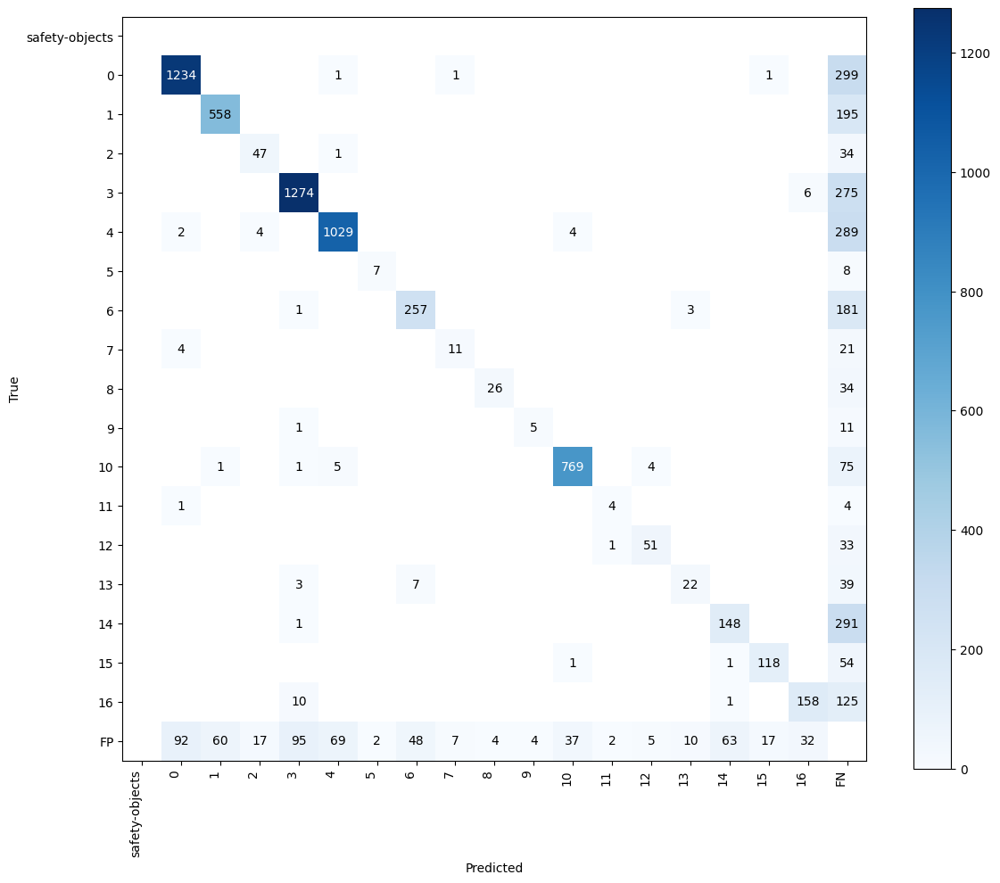

In [49]:
confusion_matrix = sv.ConfusionMatrix.from_detections(
    predictions=predictions,
    targets=targets,
    classes=ds.classes
)

confusion_matrix.plot()

In [50]:
import numpy as np

# confusion_matrix.matrix is an (N×N) array where
#   row i = actual class i  
#   col j = predicted class j
cm = confusion_matrix.matrix  
classes = ds.classes

# True positives are the diagonal
tp = np.diag(cm)

# False positives = sum of each predicted-column minus the TP
fp = cm.sum(axis=0) - tp

# False negatives = sum of each actual-row minus the TP
fn = cm.sum(axis=1) - tp

# Avoid division by zero
precision = tp / (tp + fp + 1e-8)
recall    = tp / (tp + fn + 1e-8)
f1        = 2 * (precision * recall) / (precision + recall + 1e-8)

print("Per-class metrics:")
for cls, p, r, f in zip(classes, precision, recall, f1):
    print(f"  {cls:10s} • P = {p:.3f},  R = {r:.3f},  F1 = {f:.3f}")

# you can also compute macro-averages if you want:
print("\nMacro-avg precision:", precision.mean().item())
print("Macro-avg recall   :", recall.mean().item())
print("Macro-avg F1       :", f1.mean().item())

Per-class metrics:
  safety-objects • P = 0.000,  R = 0.000,  F1 = 0.000
  0          • P = 0.926,  R = 0.803,  F1 = 0.860
  1          • P = 0.901,  R = 0.741,  F1 = 0.813
  2          • P = 0.691,  R = 0.573,  F1 = 0.627
  3          • P = 0.919,  R = 0.819,  F1 = 0.866
  4          • P = 0.931,  R = 0.775,  F1 = 0.846
  5          • P = 0.778,  R = 0.467,  F1 = 0.583
  6          • P = 0.824,  R = 0.581,  F1 = 0.682
  7          • P = 0.579,  R = 0.306,  F1 = 0.400
  8          • P = 0.867,  R = 0.433,  F1 = 0.578
  9          • P = 0.556,  R = 0.294,  F1 = 0.385
  10         • P = 0.948,  R = 0.899,  F1 = 0.923
  11         • P = 0.571,  R = 0.444,  F1 = 0.500
  12         • P = 0.850,  R = 0.600,  F1 = 0.703
  13         • P = 0.629,  R = 0.310,  F1 = 0.415
  14         • P = 0.695,  R = 0.336,  F1 = 0.453
  15         • P = 0.868,  R = 0.678,  F1 = 0.761
  16         • P = 0.806,  R = 0.537,  F1 = 0.645

Macro-avg precision: 0.7020135834792649
Macro-avg recall   : 0.5051849209454